In [1]:
rm(list = ls())

library(LalRUtils)
libreq(data.table, magrittr, tidyverse, janitor, knitr, patchwork, timeDate, plotly)

     wants        loaded
[1,] "data.table" TRUE  
[2,] "magrittr"   TRUE  
[3,] "tidyverse"  TRUE  
[4,] "janitor"    TRUE  
[5,] "knitr"      TRUE  
[6,] "patchwork"  TRUE  
[7,] "timeDate"   TRUE  
[8,] "plotly"     TRUE  


In [2]:
# theme_set(lal_plot_theme(textangle = 90))
theme_set(lal_plot_theme(textangle = 90))
set.seed(42)
options(repr.plot.width = 15, repr.plot.height=12)

# Mobility Reports Query
[info](https://console.cloud.google.com/marketplace/details/bigquery-public-datasets/covid19_google_mobility?filter=solution-type%3Adataset&id=db650d71-e53e-4677-b37b-d8bdca3ec4dc&project=spatial-acumen-244921&folder&organizationId)

In [3]:
libreq(tidyverse, DBI, dbplyr, RSQLite, bigrquery, tictoc)

     wants       loaded
[1,] "tidyverse" TRUE  
[2,] "DBI"       TRUE  
[3,] "dbplyr"    TRUE  
[4,] "RSQLite"   TRUE  
[5,] "bigrquery" TRUE  
[6,] "tictoc"    TRUE  


In [4]:
projid <- Sys.getenv("GCE_DEFAULT_PROJECT_ID")
bq_auth(email = "lal.apoorva@gmail.com",
       path = "~/keys/sandbox.json")

In [5]:
bq_con <-  dbConnect(
    bigrquery::bigquery(),
    project = "bigquery-public-data",
    dataset = "covid19_google_mobility",
    billing = projid
    )
bq_con
dbListTables(bq_con)

<BigQueryConnection>
  Dataset: bigquery-public-data.covid19_google_mobility
  Billing: spatial-acumen-244921

[1] "mobility_report"

In [6]:
mob <- tbl(bq_con, "mobility_report")
mob %>% glimpse

Rows: ??
Columns: 15
Database: BigQueryConnection
$ country_region_code                                <chr> "DO", "DO", "DO", "…
$ country_region                                     <chr> "Dominican Republic…
$ sub_region_1                                       <chr> "María Trinidad Sán…
$ sub_region_2                                       <chr> NA, NA, NA, NA, NA,…
$ metro_area                                         <chr> NA, NA, NA, NA, NA,…
$ iso_3166_2_code                                    <chr> "DO-14", "DO-28", "…
$ census_fips_code                                   <chr> NA, NA, NA, NA, NA,…
$ place_id                                           <chr> "ChIJw6EOdppGro4RMU…
$ date                                               <date> 2021-10-12, 2021-0…
$ retail_and_recreation_percent_change_from_baseline <int> 4, -5, 5, -17, -7, …
$ grocery_and_pharmacy_percent_change_from_baseline  <int> NA, 13, 47, 55, 53,…
$ parks_percent_change_from_baseline                 <int> -5, -31, -1

In [7]:
tic()
mob %>% collect() -> mobility_df
toc()

ERROR: [1m[33mError[39m in [1m[1m[30m[47m`signal_reason()`[49m[39m:[22m Exceeded rate limits: Your project:1057666841514 exceeded quota for tabledata.list bytes per second per project. For more information, see https://cloud.google.com/bigquery/troubleshooting-errors [rateLimitExceeded] 
[34mℹ[39m Try increasing the `page_size` value of `bq_table_download()`


In [ ]:
mobility_df %<>% setDT
mobility_df %>% glimpse()

In [10]:
fwrite(mobility_df, "data/google-mobility-reports.csv.gz")
dbDisconnect(bq_con)

## Viz

In [11]:
mobility_df = fread("data/google-mobility-reports.csv.gz")
old = c('retail_and_recreation_percent_change_from_baseline',
  'grocery_and_pharmacy_percent_change_from_baseline',
  'parks_percent_change_from_baseline',
  'transit_stations_percent_change_from_baseline',
  'workplaces_percent_change_from_baseline',
  'residential_percent_change_from_baseline')
new = c("retail", "grocery", "parks", "transit", "work", "home")
setnames(mobility_df, old, new)
mobility_df[, d := lubridate::ymd(date)]
mobility_df[, weekend := isWeekend(d)]
mobility_df %>% glimpse

Rows: 6,277,974
Columns: 17
$ country_region_code <chr> "BE", "BE", "BE", "BE", "BE", "BE", "BE", "BE", "B…
$ country_region      <chr> "Belgium", "Belgium", "Belgium", "Belgium", "Belgi…
$ sub_region_1        <chr> "Flanders", "Flanders", "Flanders", "Flanders", "F…
$ sub_region_2        <chr> "Antwerp", "Antwerp", "Antwerp", "Antwerp", "Antwe…
$ metro_area          <chr> "", "", "", "", "", "", "", "", "", "", "", "", ""…
$ iso_3166_2_code     <chr> "BE-VAN", "BE-VAN", "BE-VAN", "BE-VAN", "BE-VAN", …
$ census_fips_code    <int> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA…
$ place_id            <chr> "ChIJYxqH-B5VwUcRT7U_zWa6lgg", "ChIJYxqH-B5VwUcRT7…
$ date                <date> 2020-03-15, 2020-05-25, 2020-05-29, 2020-06-08, 2…
$ retail              <int> -66, -28, -38, -17, -12, 5, -73, -30, -28, -12, -2…
$ grocery             <int> -16, -6, 6, -11, -11, 23, -20, 2, 16, 0, 6, 12, 1,…
$ parks               <int> 24, 48, 46, -3, 2, 119, -16, 15, 136, 53, -19, 31,…
$ transit   

### US Counties

In [12]:
us_mob = mobility_df[country_region_code == "US"]
us_mob %>% head

country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,place_id,date,retail,grocery,parks,transit,work,home,d,weekend
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<date>,<int>,<int>,<int>,<int>,<int>,<int>,<date>,<lgl>
US,United States,Alabama,Autauga County,,,1001,ChIJg9z7ewWPjogRA_8QrB0va7o,2020-09-04,NA,NA,NA,NA,-29,5,2020-09-04,FALSE
US,United States,Alabama,Autauga County,,,1001,ChIJg9z7ewWPjogRA_8QrB0va7o,2020-10-31,8,16,NA,NA,-8,-3,2020-10-31,TRUE
US,United States,Alabama,Autauga County,,,1001,ChIJg9z7ewWPjogRA_8QrB0va7o,2020-12-18,-3,2,NA,NA,-29,9,2020-12-18,FALSE
US,United States,Alabama,Autauga County,,,1001,ChIJg9z7ewWPjogRA_8QrB0va7o,2021-01-26,-19,-10,NA,NA,-22,8,2021-01-26,FALSE
US,United States,Alabama,Baldwin County,,,1003,ChIJMRERvxBnmogR0K_9O08dxDw,2020-05-05,-19,10,26,-14,-30,9,2020-05-05,FALSE
US,United States,Alabama,Baldwin County,,,1003,ChIJMRERvxBnmogR0K_9O08dxDw,2020-09-06,23,40,NA,NA,-17,0,2020-09-06,TRUE


In [13]:
bay   = paste0(c( "San Francisco", "San Mateo", "Santa Clara",
                        "Alameda", "Contra Costa", "Marin"), " County")

socal = paste0(c("Los Angeles", "Orange", "San Bernardino", "Riverside", "Ventura", "Merced"),
               " County")

bay_area = us_mob[sub_region_1 == "California" & sub_region_2 %in% bay ]

la_area = us_mob[sub_region_1 == "California" & sub_region_2 %in% socal ]

# long
bay_area2 = melt(bay_area, id.vars = c("sub_region_2", "d", "weekend"),
        measure = c("retail", "grocery", "parks", "transit", "work", "home"),
        variable.name = "category")
la_area2 = melt(la_area, id.vars = c("sub_region_2", "d", "weekend"),
        measure = c("retail", "grocery", "parks", "transit", "work", "home"),
        variable.name = "category")

bay_area2 %>% head

sub_region_2,d,weekend,category,value
<chr>,<date>,<lgl>,<fct>,<int>
Alameda County,2020-03-31,FALSE,retail,-48
Alameda County,2020-07-27,FALSE,retail,-37
Alameda County,2020-10-18,TRUE,retail,-35
Alameda County,2021-01-05,FALSE,retail,-41
Alameda County,2021-04-03,TRUE,retail,-31
Contra Costa County,2020-03-29,TRUE,retail,-48


Function to plot mobility with sensible faceting + gray bars for weekends.

In [14]:
mobility_faceted = function(df, cmap = T, leg = T, wknd = F){
    p =  ggplot(df, aes(x = d, y = value, group = category, colour = category))
    if (wknd == T){
        p = p + geom_vline(data = df[weekend == T],
                     mapping = aes(xintercept = d),
                     color = 'gray', size = 2.9, alpha = 0.1)
    }
    p = p + geom_point(size = 1, alpha = 0.5) + geom_smooth(se = F, size = 0.8) +
            geom_hline(yintercept = 0, colour = 'gray', linetype = 'dashed') +
            scale_x_date(date_breaks = "1 week", date_labels = "%b %d") +
            facet_wrap(~ sub_region_2, scale = "free")
    if (cmap == T) p = p + scale_colour_brewer(palette = "Set2")
    if (leg == F) p = p + guides(colour = F)
    return(p)
}


mobility_plotter = function(df, col, cmap = T, leg = F){
    p = df %>%
        ggplot(aes(x = d, y = {{ col }}, group = sub_region_2, colour = sub_region_2)) +
            geom_hline(yintercept = 0, colour = 'gray', linetype = 'dashed') +
#             geom_vline(data = df[weekend == T],
#                      mapping = aes(xintercept = d),
#                      color = 'gray', size = 2.9, alpha = 0.1) +
            geom_point() + geom_smooth(se = F) +
            scale_x_date(date_breaks = "1 week", date_labels = "%b %d")
    if (cmap == T) p = p + scale_colour_brewer(palette = "Set2")
    if (leg == F) p = p + guides(colour = F)
    return(p)
}

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



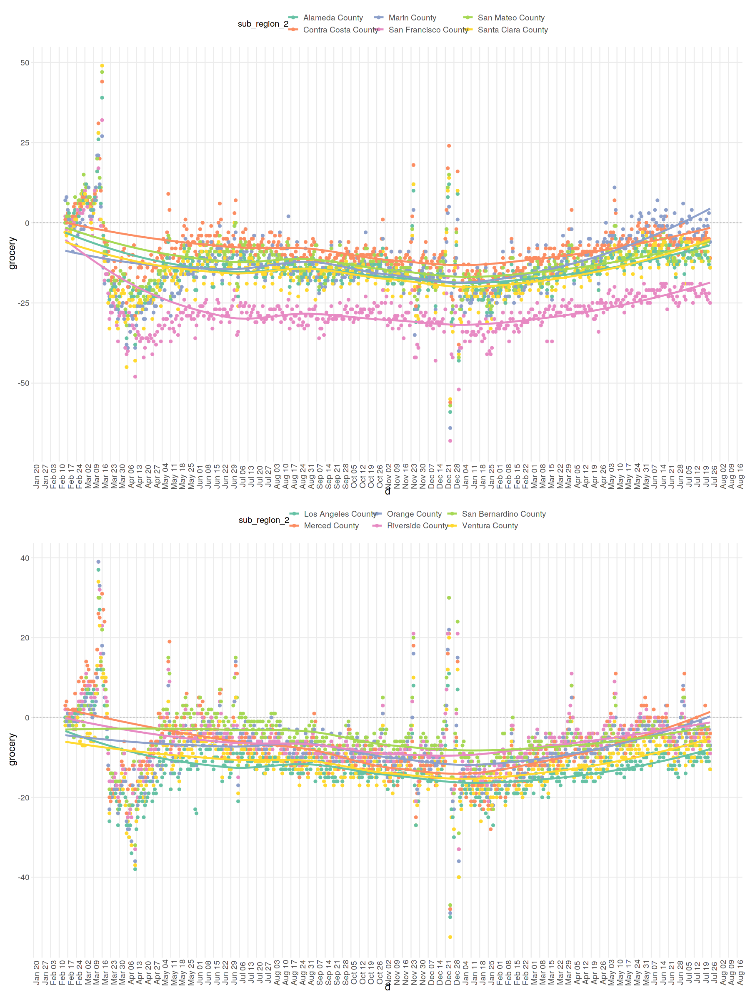

In [15]:
options(repr.plot.width = 15, repr.plot.height=20)
mobility_plotter(bay_area, grocery, leg = T) / mobility_plotter(la_area, grocery, leg = T)

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

Warning message:
“Removed 28 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 28 rows containing missing values (geom_point).”
`geom_smooth()` using method = 'loess' and formula 'y ~ x'

Warning message:
“Removed 25 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 25 rows containing missing values (geom_point).”


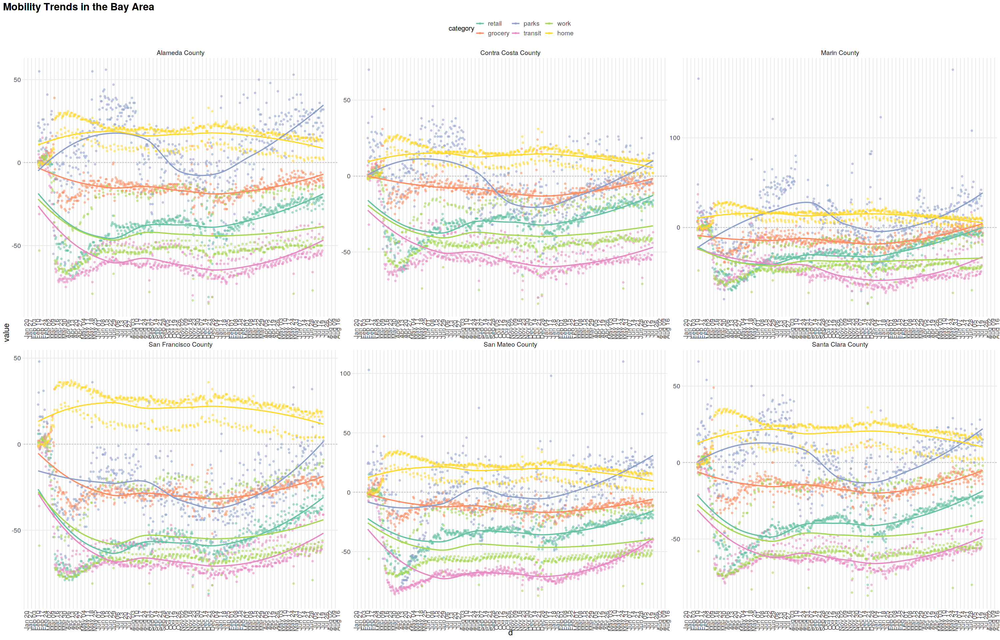

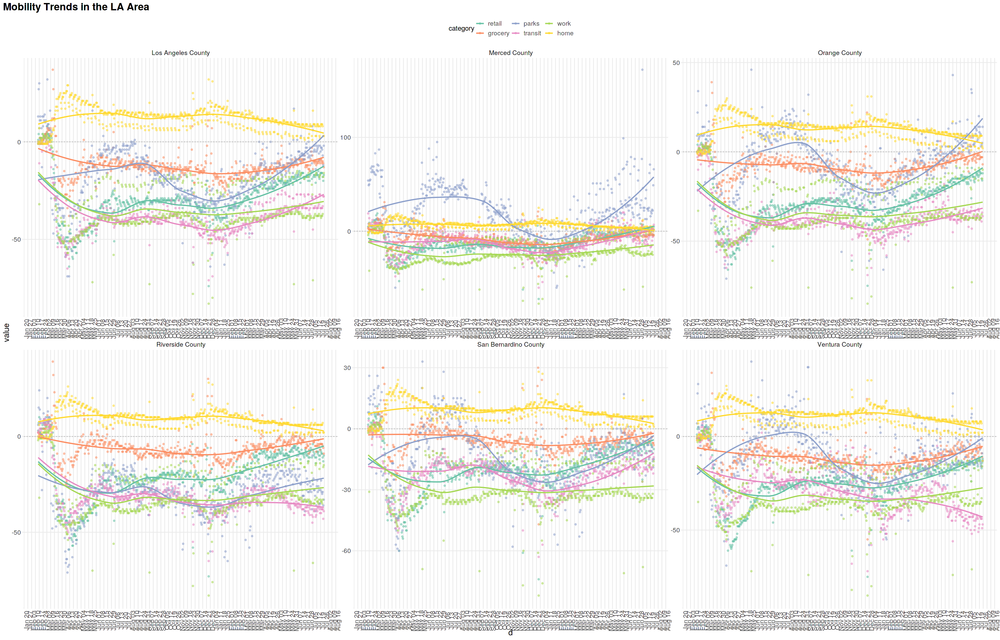

In [16]:
options(repr.plot.width = 25, repr.plot.height=16)
mobility_faceted(bay_area2) + ggtitle("Mobility Trends in the Bay Area")
mobility_faceted(la_area2)  + ggtitle("Mobility Trends in the LA Area")

## International

### Helper Functions

In [17]:
melter = function(df, keys = c("country_region", "d", "weekend")){
    df_long = melt(df, id.vars = keys,
        measure = c("retail", "grocery", "parks", "transit", "work", "home"),
        variable.name = "category")
    return(df_long)
}

subregion_faceted = function(df, cmap = T, freescale = F, leg = T, wknd = F){
    p = ggplot(df, aes(x = d, y = value, group = category, colour = category))
    if (wknd == T){
        p = p + geom_vline(data = df[weekend == T], mapping = aes(xintercept = d),
                     color = 'gray', size = 2.9, alpha = 0.1)
    }
    p = p +
        geom_point(size = 1, alpha = 0.5) + geom_smooth(se = F, size = 0.6) +
        geom_hline(yintercept = 0, colour = 'gray', linetype = 'dashed') +
        scale_x_date(date_breaks = "1 week", date_labels = "%m-%d")
    if (freescale == T) {
        p = p + facet_wrap(~ sub_region_1, scale = "free_y")
    } else{
        p = p + facet_wrap(~ sub_region_1)
    }
    if (cmap == T) p = p + scale_colour_brewer(palette = "Set2")
    if (leg == F) p = p + guides(colour = F)
    return(p)
}

country_faceted = function(df, freescale = F,  cmap = F, leg = F, wknd = F){
    p = ggplot(df, aes(x = d, y = value))
    if (wknd == T){
        p = p + geom_vline(data = df[weekend == T], mapping = aes(xintercept = d),
                     color = 'gray', size = 2.9, alpha = 0.1)
    }
    p = p +
        geom_point(size = 1, alpha = 0.5) + geom_smooth(se = F, size = 0.6) +
        geom_hline(yintercept = 0, colour = 'gray', linetype = 'dashed') +
        scale_x_date(date_breaks = "1 week", date_labels = "%m-%d")
    if (freescale == T) {
        p = p + facet_wrap(~ category, scale = "free")
    } else{
        p = p + facet_wrap(~ category)
    }
    if (cmap == T) p = p + scale_colour_brewer(palette = "Set2")
    if (leg == F) p = p + guides(colour = F)
    return(p)
}

mob_plotter = function(df, col, grp, leg = T){
    p = df %>%
        ggplot(aes(x = d, y = {{ col }}, group = {{grp}}, colour = {{grp}})) +
            geom_hline(yintercept = 0, colour = 'gray', linetype = 'dashed') +
#             geom_vline(data = df[weekend == T],
#                      mapping = aes(xintercept = d),
#                      color = 'gray', size = 2.9, alpha = 0.3) +
        geom_point() + geom_smooth(se = F) +
        scale_x_date(date_breaks = "1 week", date_labels = "%m-%d")
    if (leg == F) p = p + guides(colour = F)
    return(p)
}

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
`geom_smooth()` using method = 'loess' and formula 'y ~ x'



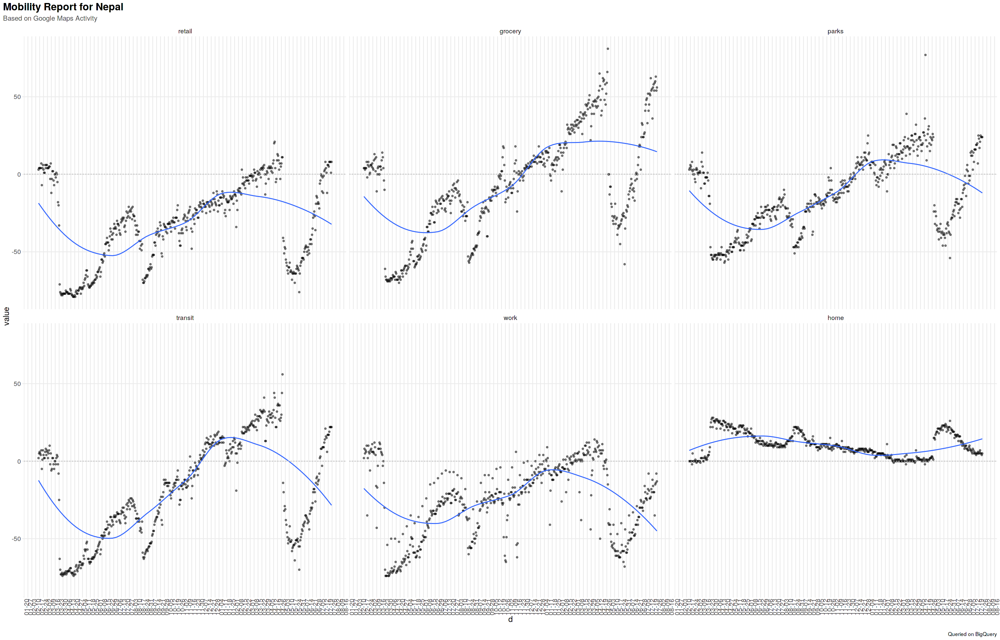

In [18]:
nep = mobility_df[country_region =="Nepal"]
nep_l = melter(nep)
(nep = country_faceted(nep_l) +
    labs(title = "Mobility Report for Nepal", subtitle = "Based on Google Maps Activity", caption = "Queried on BigQuery"))

In [19]:
ggsave("nep_mobility.jpg", nep, width = 20, height = 15)

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,place_id,date,retail,grocery,parks,transit,work,home,d,weekend
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<date>,<int>,<int>,<int>,<int>,<int>,<int>,<date>,<lgl>
IN,India,Bihar,,,IN-BR,NA,ChIJA2m78ERY7TkRJeO6G-0_rVc,2020-03-22,-62,-62,-33,-58,-34,14,2020-03-22,TRUE
IN,India,Bihar,,,IN-BR,NA,ChIJA2m78ERY7TkRJeO6G-0_rVc,2020-11-20,-22,25,17,-13,-48,8,2020-11-20,FALSE
IN,India,Bihar,,,IN-BR,NA,ChIJA2m78ERY7TkRJeO6G-0_rVc,2021-02-12,-9,34,1,3,-3,7,2021-02-12,FALSE
IN,India,Bihar,,,IN-BR,NA,ChIJA2m78ERY7TkRJeO6G-0_rVc,2021-03-04,-8,34,3,5,0,7,2021-03-04,FALSE
IN,India,Bihar,,,IN-BR,NA,ChIJA2m78ERY7TkRJeO6G-0_rVc,2021-03-16,-10,29,5,5,-2,7,2021-03-16,FALSE
IN,India,Bihar,,,IN-BR,NA,ChIJA2m78ERY7TkRJeO6G-0_rVc,2021-04-10,-14,31,-1,0,-7,11,2021-04-10,TRUE


Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
`geom_smooth()` using method = 'loess' and formula 'y ~ x'



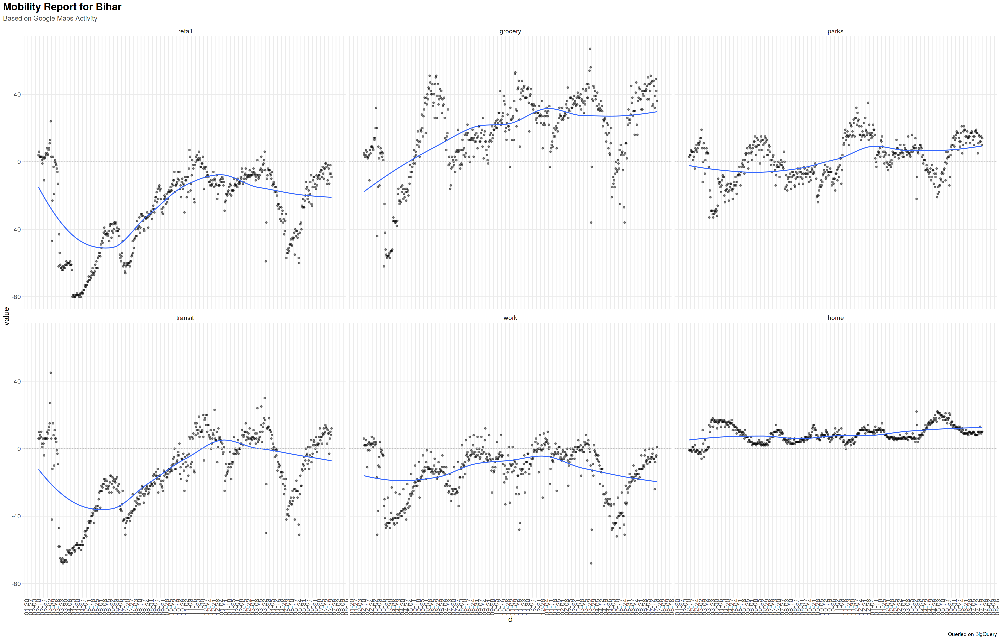

In [20]:
bih = mobility_df[country_region =="India" & sub_region_1 == "Bihar" & sub_region_2 == ""]
bih %>% head
bih_l = melter(bih)
(bih = country_faceted(bih_l) +
    labs(title = "Mobility Report for Bihar", subtitle = "Based on Google Maps Activity", caption = "Queried on BigQuery"))

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
`geom_smooth()` using method = 'loess' and formula 'y ~ x'



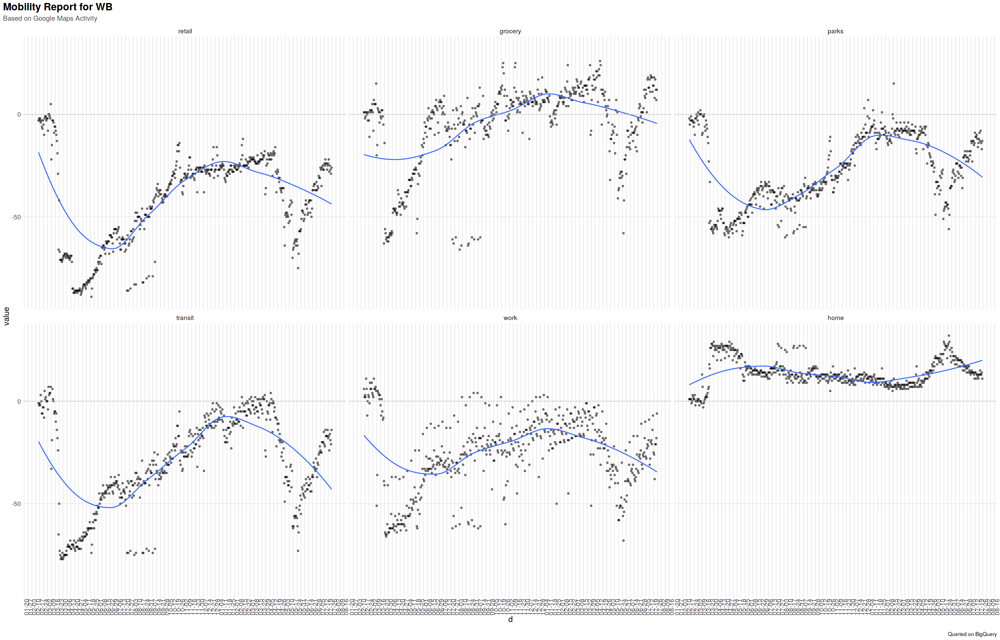

In [21]:
wb= mobility_df[country_region =="India" & sub_region_1 == "West Bengal" & sub_region_2 == ""]
wb_l = melter(wb)
(wb = country_faceted(wb_l) +
    labs(title = "Mobility Report for WB", subtitle = "Based on Google Maps Activity", caption = "Queried on BigQuery"))

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



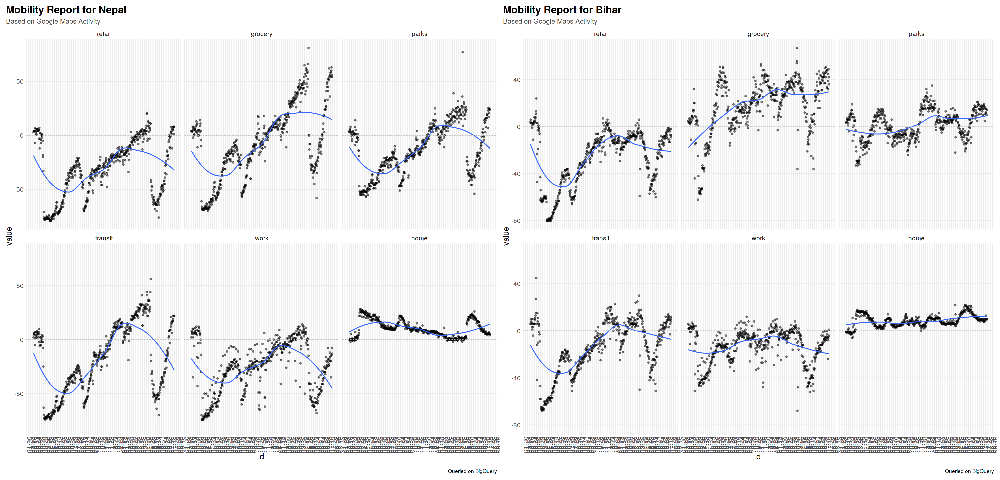

In [22]:
options(repr.plot.width = 25, repr.plot.height=12)
(nep | bih)

In [26]:
ind = mobility_df[country_region =="India"]
ind_l = melter(ind, c("sub_region_1", "d", "weekend"))
ind_l = ind_l[sub_region_1 != ""][order(d)]
ind %>% head

country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,place_id,date,retail,grocery,parks,transit,work,home,d,weekend
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<date>,<int>,<int>,<int>,<int>,<int>,<int>,<date>,<lgl>
IN,India,Andaman and Nicobar Islands,North and Middle Andaman,,,NA,ChIJs5lpAH2kjzARilD7p7n6fns,2020-10-10,NA,NA,NA,NA,19,NA,2020-10-10,TRUE
IN,India,Andaman and Nicobar Islands,North and Middle Andaman,,,NA,ChIJs5lpAH2kjzARilD7p7n6fns,2021-01-27,NA,NA,NA,NA,22,NA,2021-01-27,FALSE
IN,India,Andaman and Nicobar Islands,North and Middle Andaman,,,NA,ChIJs5lpAH2kjzARilD7p7n6fns,2021-02-26,NA,NA,NA,NA,9,NA,2021-02-26,FALSE
IN,India,Andaman and Nicobar Islands,South Andaman,,,NA,ChIJEU2QUeUOjzAR9ynzlt7zsYk,2020-03-14,-19,NA,-5,-8,-6,6,2020-03-14,TRUE
IN,India,Andaman and Nicobar Islands,South Andaman,,,NA,ChIJEU2QUeUOjzAR9ynzlt7zsYk,2020-05-22,-81,NA,-82,-52,-35,16,2020-05-22,FALSE
IN,India,Andaman and Nicobar Islands,South Andaman,,,NA,ChIJEU2QUeUOjzAR9ynzlt7zsYk,2020-08-16,-86,NA,-76,-55,-31,32,2020-08-16,TRUE


`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

Warning message:
“Removed 111310 rows containing non-finite values (stat_smooth).”
Warning message:
“Computation failed in `stat_smooth()`:
x has insufficient unique values to support 10 knots: reduce k.”
Warning message:
“Removed 111310 rows containing missing values (geom_point).”
`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

Warning message:
“Removed 111310 rows containing non-finite values (stat_smooth).”
Warning message:
“Computation failed in `stat_smooth()`:
x has insufficient unique values to support 10 knots: reduce k.”
Warning message:
“Removed 111310 rows containing missing values (geom_point).”


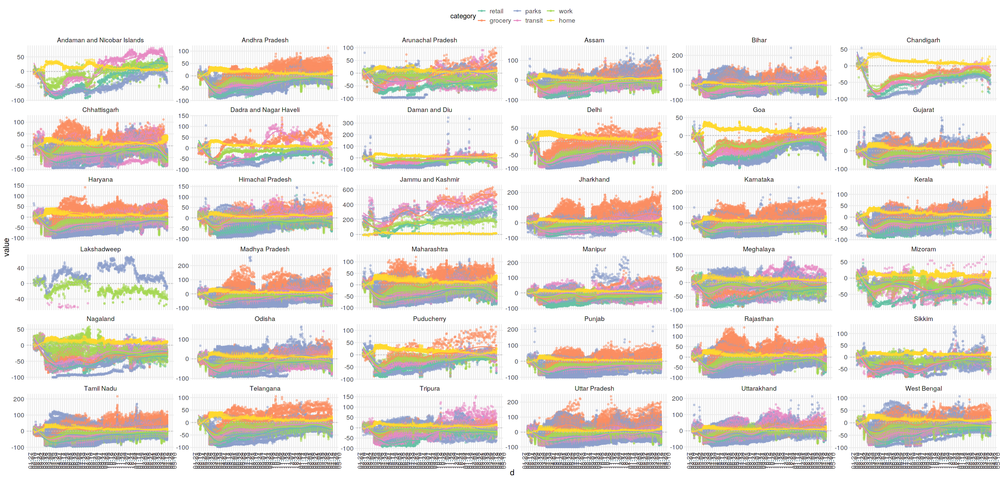

In [27]:
options(repr.plot.width = 25, repr.plot.height=12)
(ind_disagg = subregion_faceted(ind_l, freescale = T))
ggsave("ind_mobility.jpg", ind_disagg, width = 30, height = 30)

Jammu and Kashmir up by 300%+ because the baseline period corresponds with a sever lockdown [for political reasons - abrogation of article 370 etc]. Baselines matter in DiD.

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

Warning message:
“Removed 351 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 351 rows containing missing values (geom_point).”


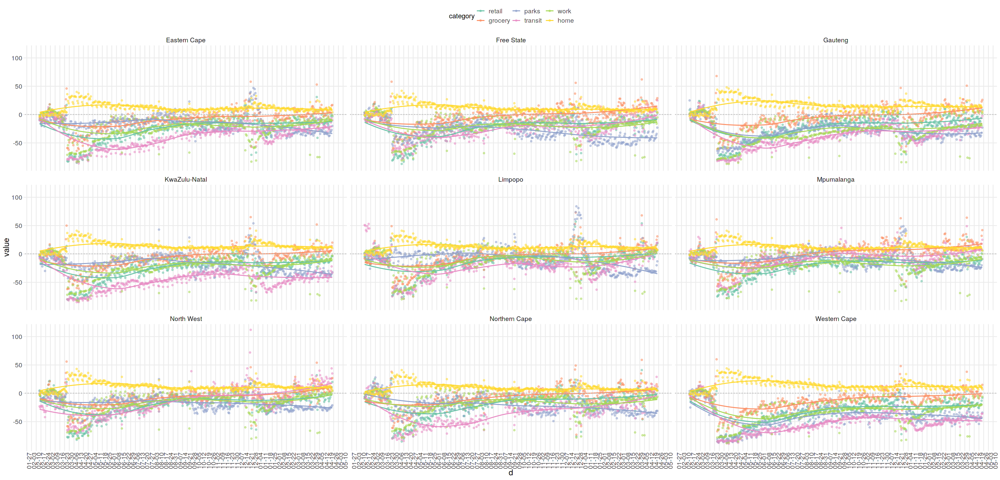

In [28]:
d = mobility_df[country_region =="South Africa"]
d_l= melter(d, c("sub_region_1", "d", "weekend")) %>% .[sub_region_1 != ""]
(ind_disagg = subregion_faceted(d_l))

### Subregion Data Availability

In [29]:
countries_w_subn = mobility_df[, .(sub = unique(sub_region_1)), by = country_region][sub != ""]
countries_w_subn[, unique(country_region)] %>% print

 [1] "Belgium"              "Bolivia"              "Cameroon"            
 [4] "Honduras"             "Israel"               "Lebanon"             
 [7] "Mozambique"           "Rwanda"               "Tanzania"            
[10] "Uganda"               "Zimbabwe"             "United Arab Emirates"
[13] "Antigua and Barbuda"  "Angola"               "Barbados"            
[16] "Burkina Faso"         "Benin"                "The Bahamas"         
[19] "Botswana"             "Belize"               "Switzerland"         
[22] "Côte d'Ivoire"        "Cape Verde"           "Germany"             
[25] "Dominican Republic"   "Estonia"              "Egypt"               
[28] "Gabon"                "Greece"               "Croatia"             
[31] "Haiti"                "Hungary"              "Indonesia"           
[34] "Ireland"              "Jamaica"              "Jordan"              
[37] "Japan"                "Kenya"                "Kyrgyzstan"          
[40] "Cambodia"             "Kuwait"  

In [30]:
countries_w_subn = mobility_df[, .(sub = unique(sub_region_2)), by = country_region][sub != ""]
countries_w_subn[, unique(country_region)] %>% print

 [1] "Belgium"        "Bolivia"        "Cameroon"       "Honduras"      
 [5] "Israel"         "Lebanon"        "Mozambique"     "Rwanda"        
 [9] "Tanzania"       "Uganda"         "Zimbabwe"       "Argentina"     
[13] "Austria"        "Australia"      "Bulgaria"       "Brazil"        
[17] "Canada"         "Chile"          "Colombia"       "Czechia"       
[21] "Denmark"        "Ecuador"        "Spain"          "Finland"       
[25] "France"         "United Kingdom" "Guatemala"      "India"         
[29] "Italy"          "Lithuania"      "Nigeria"        "Netherlands"   
[33] "Norway"         "Peru"           "Poland"         "Portugal"      
[37] "Romania"        "Sweden"         "Slovenia"       "Slovakia"      
[41] "Turkey"         "United States" 


In [31]:
countries_w_metros = mobility_df[, .(sub = unique(metro_area)), by = country_region][sub != ""]
countries_w_metros[, unique(country_region)] %>% print

 [1] "Afghanistan"     "Egypt"           "Georgia"         "Ghana"          
 [5] "Haiti"           "Jordan"          "Kenya"           "South Korea"    
 [9] "Kuwait"          "Morocco"         "Mali"            "Myanmar (Burma)"
[13] "Niger"           "Nicaragua"       "Panama"          "Philippines"    
[17] "Pakistan"        "Qatar"           "Serbia"          "Russia"         
[21] "Tajikistan"      "Ukraine"         "Uruguay"         "Zambia"         


# Oxford Govt Policy Tracker

In [23]:
options(repr.plot.width = 12, repr.plot.height=10)

In [24]:
projid <- Sys.getenv("GCE_DEFAULT_PROJECT_ID")
bq_auth(email = "lal.apoorva@gmail.com",
       path = "~/keys/sandbox.json")

In [25]:
bq_con <-  dbConnect(
    bigrquery::bigquery(),
    project = "bigquery-public-data",
    dataset = "covid19_govt_response",
    billing = projid
    )
bq_con
dbListTables(bq_con)

<BigQueryConnection>
  Dataset: bigquery-public-data.covid19_govt_response
  Billing: spatial-acumen-244921

[1] "oxford_policy_tracker"

In [26]:
mob <- tbl(bq_con, "oxford_policy_tracker")
mob %>% glimpse

Rows: ??
Columns: 53
Database: BigQueryConnection
$ country_name                            <chr> "Aruba", "Aruba", "Aruba", "Ar…
$ alpha_3_code                            <chr> "ABW", "ABW", "ABW", "ABW", "A…
$ region_name                             <chr> NA, NA, NA, NA, NA, NA, NA, NA…
$ region_code                             <chr> NA, NA, NA, NA, NA, NA, NA, NA…
$ date                                    <date> 2021-07-06, 2021-07-07, 2021-…
$ school_closing                          <chr> NA, NA, NA, NA, NA, NA, NA, NA…
$ school_closing_flag                     <chr> NA, NA, NA, NA, NA, NA, NA, NA…
$ school_closing_notes                    <chr> NA, NA, NA, NA, NA, NA, NA, NA…
$ workplace_closing                       <chr> NA, NA, NA, NA, NA, NA, NA, NA…
$ workplace_closing_flag                  <chr> NA, NA, NA, NA, NA, NA, NA, NA…
$ workplace_closing_notes                 <chr> NA, NA, NA, NA, NA, NA, NA, NA…
$ cancel_public_events                    <chr> NA, NA, NA, NA, NA, NA

In [27]:
tic()
mob %>% collect() ->
    policies
toc()

23.32 sec elapsed


In [28]:
policies %<>% setDT

fwrite(policies, "data/ox_policy_tracker.csv.gz")
dbDisconnect(bq_con)

### Viz

In [29]:
policies = fread("data/ox_policy_tracker.csv.gz")
policies[, date := lubridate::ymd(date)]
policies %>% glimpse

Rows: 179,400
Columns: 53
$ country_name                            <chr> "Aruba", "Aruba", "Aruba", "Ar…
$ alpha_3_code                            <chr> "ABW", "ABW", "ABW", "ABW", "A…
$ region_name                             <chr> "", "", "", "", "", "", "", ""…
$ region_code                             <chr> "", "", "", "", "", "", "", ""…
$ date                                    <date> 2021-07-06, 2021-07-07, 2021-…
$ school_closing                          <dbl> NA, NA, NA, NA, NA, NA, NA, NA…
$ school_closing_flag                     <int> NA, NA, NA, NA, NA, NA, NA, NA…
$ school_closing_notes                    <chr> "", "", "", "", "", "", "", ""…
$ workplace_closing                       <dbl> NA, NA, NA, NA, NA, NA, NA, NA…
$ workplace_closing_flag                  <int> NA, NA, NA, NA, NA, NA, NA, NA…
$ workplace_closing_notes                 <chr> "", "", "", "", "", "", "", ""…
$ cancel_public_events                    <dbl> NA, NA, NA, NA, NA, NA, NA, NA…
$ cancel_publi

In [30]:
country_obs = policies[, .N, by = .(country_name, alpha_3_code)][order(country_name)]
country_obs

country_name,alpha_3_code,N
<chr>,<chr>,<int>
Afghanistan,AFG,575
Albania,ALB,575
Algeria,DZA,575
Andorra,AND,575
Angola,AGO,575
Argentina,ARG,575
Aruba,ABW,575
Australia,AUS,575
Austria,AUT,575


In [31]:
country_obs[N > median(N)]

country_name,alpha_3_code,N
<chr>,<chr>,<int>
Brazil,BRA,16100
Canada,CAN,8050
China,CHN,18400
United Kingdom,GBR,2875
United States,USA,29900


In [32]:
sa = policies[alpha_3_code %in% c("IND", "NPL", "PAK", "BGD", "LKA", "AFG")]

tsplot = function(df, grouper = alpha_3_code){
    p = ggplot(df, aes(x = date, y = stringency_index, group = {{grouper}}, colour = {{grouper}})) +
    geom_line() 
    return(p)
}

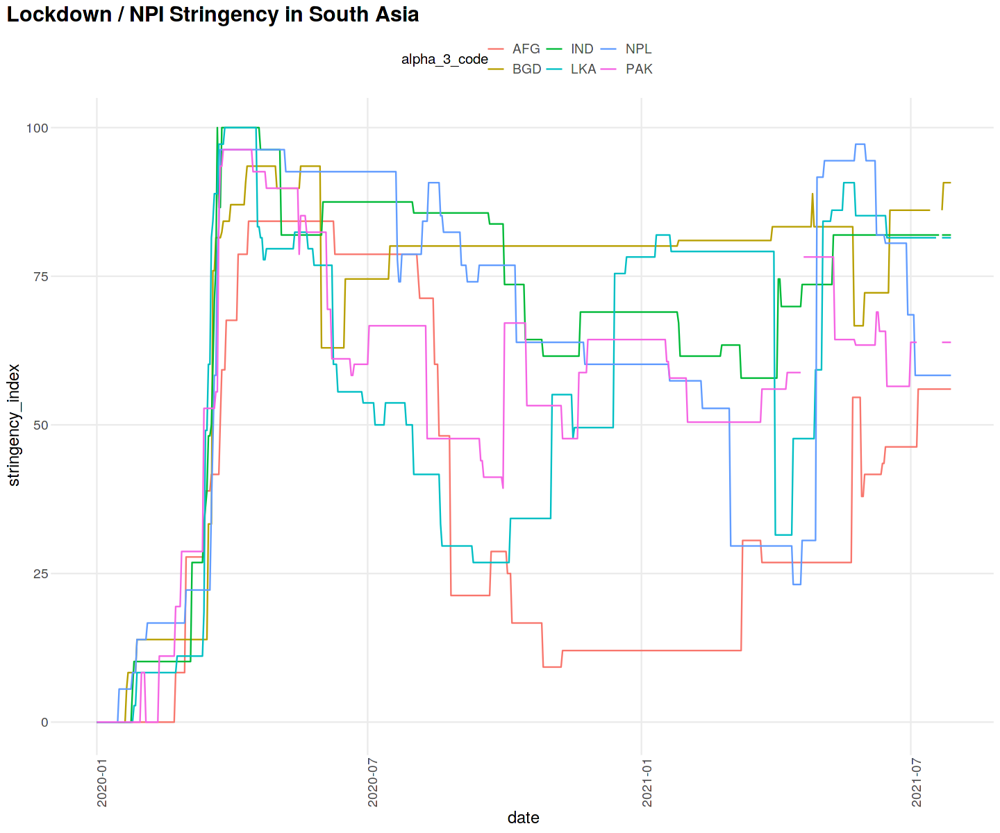

In [33]:
tsplot(sa) + ggtitle("Lockdown / NPI Stringency in South Asia")

Warning message:
“Removed 25 row(s) containing missing values (geom_path).”


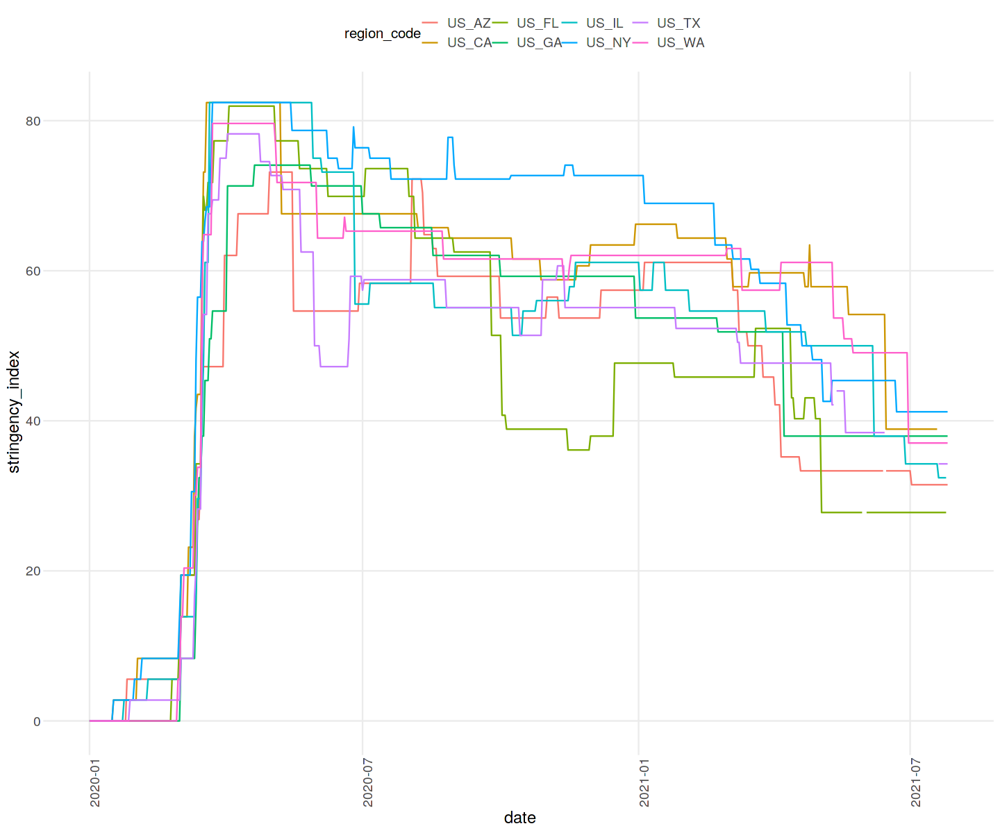

In [34]:
policies[alpha_3_code == "USA"][region_code %in% c("US_CA", "US_NY", "US_FL", "US_TX", "US_IL", "US_GA", "US_WA", "US_AZ")] %>% tsplot(., region_code)